# Escuela Politécnica Nacional 
## Métodos Numéricos

**Nombre:** Lenin Amangandi

**Tema:** Splines Cúbicos

[Link al repositorio Taller N4](https://github.com/Lenin27Amangandi/Workspace-Metodos-Numericos-2k25A-/tree/main/Talleres/TallerN4)


**Complete el código del siguiente repositorio:**  
[Repositorio](https://github.com/ztjona/splines)

**Compruebe gráficamente la solución de los siguientes ejercicios:**

- (0, 1), (1, 5), (2, 3)
- (0, −5), (1, −4), (2, 3)
- (0, −1), (1, 1), (2, 5), (3, 2)

**Para cada uno de los ejercicios anteriores, resuelva los **splines cúbicos de frontera condicionada** con:**

- $ B_0 = 1 $
- Para todos los valores de $ B_1 \in \mathbb{R} $

**Animaciones solicitadas**

- Realice una animación de la variación de los splines cúbicos al variar $ B_1 $.
- Realice una animación al mover el punto $ (x_1, y_1) $.


In [2]:
import sympy as sym
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


def cubic_spline(xs: list[float], ys: list[float]) -> list[sym.Symbol]:

    points = sorted(zip(xs, ys), key=lambda x: x[0])
    xs = [x for x, _ in points]
    ys = [y for _, y in points]

    n = len(points) - 1

    h = [xs[i + 1] - xs[i] for i in range(n)]

    alpha = [0] * (n+1)
    for i in range(1, n):
        alpha[i] = 3 / h[i] * (ys[i + 1] - ys[i]) - 3 / h[i - 1] * (ys[i] - ys[i - 1])

    l = [1]
    u = [0]
    z = [0]

    for i in range(1, n):
        l += [2 * (xs[i + 1] - xs[i - 1]) - h[i - 1] * u[i - 1]]
        u += [h[i] / l[i]]
        z += [(alpha[i] - h[i - 1] * z[i - 1]) / l[i]]

    l.append(1)
    z.append(0)
    c = [0] * (n + 1)

    x = sym.Symbol("x")
    splines = []
    for j in range(n - 1, -1, -1):
        c[j] = z[j] - u[j] * c[j + 1]
        b = (ys[j + 1] - ys[j]) / h[j] - h[j] * (c[j + 1] + 2 * c[j]) / 3
        d = (c[j + 1] - c[j]) / (3 * h[j])
        a  = ys[j]
        print(j, a, b, c[j], d)
        S  = a + b * (x - xs[j]) + c[j] * (x - xs[j])**2 + d * (x - xs[j])**3

        splines.append(S)
    splines.reverse()
    return splines

In [ ]:

def get_clamped_spline_curve(xs, ys, B0, B1, resolution=100):
    n = len(xs) - 1
    h = np.diff(xs)
    
    alpha = np.zeros(n + 1)
    alpha[0] = 3 * (ys[1] - ys[0]) / h[0] - 3 * B0
    alpha[n] = 3 * B1 - 3 * (ys[n] - ys[n-1]) / h[n-1]
    
    for i in range(1, n):
        alpha[i] = (3 / h[i]) * (ys[i+1] - ys[i]) - (3 / h[i-1]) * (ys[i] - ys[i-1])
    
    l = np.zeros(n + 1)
    u = np.zeros(n + 1)
    z = np.zeros(n + 1)
    
    l[0] = 2 * h[0]
    u[0] = 0.5
    z[0] = alpha[0] / l[0]
    
    for i in range(1, n):
        l[i] = 2 * (xs[i+1] - xs[i-1]) - h[i-1] * u[i-1]
        u[i] = h[i] / l[i]
        z[i] = (alpha[i] - h[i-1] * z[i-1]) / l[i]
        
    l[n] = h[n-1] * (2 - u[n-1])
    z[n] = (alpha[n] - h[n-1] * z[n-1]) / l[n]
    
    c = np.zeros(n + 1)
    c[n] = z[n]
    
    b = np.zeros(n)
    d = np.zeros(n)
    a = np.array(ys)
    
    for j in range(n - 1, -1, -1):
        c[j] = z[j] - u[j] * c[j+1]
        b[j] = (a[j+1] - a[j]) / h[j] - h[j] * (c[j+1] + 2 * c[j]) / 3
        d[j] = (c[j+1] - c[j]) / (3 * h[j])
        
    X_plot = []
    Y_plot = []
    for j in range(n):
        xs_j = np.linspace(xs[j], xs[j+1], resolution)
        ys_j = a[j] + b[j]*(xs_j - xs[j]) + c[j]*(xs_j - xs[j])**2 + d[j]*(xs_j - xs[j])**3
        X_plot.extend(xs_j)
        Y_plot.extend(ys_j)
        
    return X_plot, Y_plot

In [5]:
xs = [0, 1, 2]
ys = [-5, -4, 3]

splines = cubic_spline(xs=xs, ys=ys)
_ = [display(s) for s in splines]
_ = [display(s.expand()) for s in splines]

1 -4 4.0 4.5 -1.5
0 -5 -0.5 0.0 1.5


1.5*x**3 - 0.5*x - 5

4.0*x - 1.5*(x - 1)**3 + 4.5*(x - 1)**2 - 8.0

1.5*x**3 - 0.5*x - 5

-1.5*x**3 + 9.0*x**2 - 9.5*x - 2.0

In [7]:
xs = [0, 1, 2]
ys = [1, 5, 3]

splines = cubic_spline(xs=xs, ys=ys)
_ = [display(s) for s in splines]
_ = [display(s.expand()) for s in splines]

1 5 1.0 -4.5 1.5
0 1 5.5 0.0 -1.5


-1.5*x**3 + 5.5*x + 1

1.0*x + 1.5*(x - 1)**3 - 4.5*(x - 1)**2 + 4.0

-1.5*x**3 + 5.5*x + 1

1.5*x**3 - 9.0*x**2 + 14.5*x - 2.0

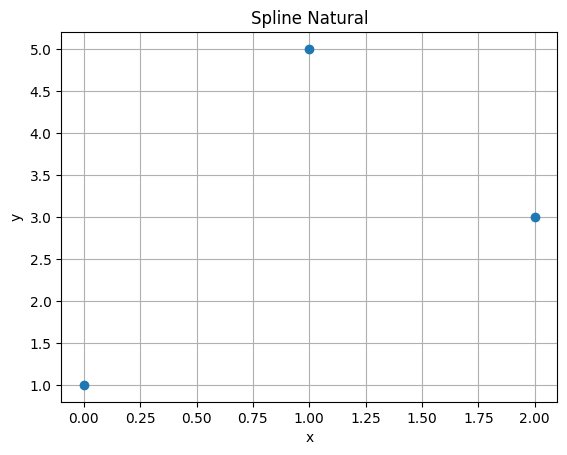

In [8]:
x = [0, 1, 2]
y = [1, 5, 3]
plt.plot(x, y, 'o')
plt.title('Spline Natural')
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

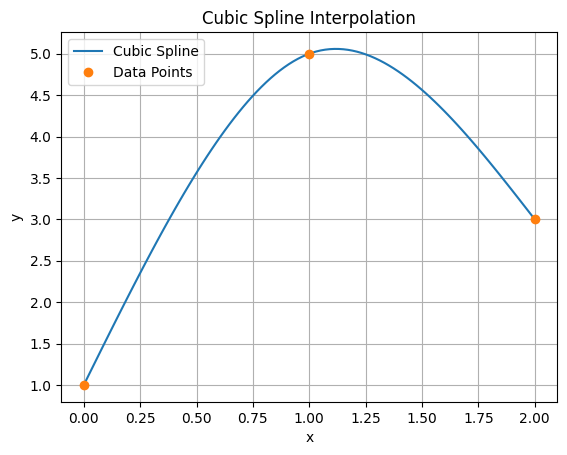

In [9]:
def S_0(x):
    return -1.5*x**3 + 5.5*x + 1
def S_1(x):
    return 1.5*x**3 -9 *x**2 +14.5*x -2

x_vals = np.linspace(0, 2, 100)
y_vals = np.piecewise(x_vals, [x_vals < 1, x_vals >= 1], [S_0, S_1])
plt.plot(x_vals, y_vals, label='Cubic Spline')
plt.plot(x, y, 'o', label='Data Points')
plt.title('Cubic Spline Interpolation')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid()
plt.show()

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.interpolate import CubicSpline  # Importar la clase CubicSpline
from IPython.display import HTML

# Datos de entrada
xs_data = [0, 1, 2]
ys_data = [1, 5, 3]

# Crear las figuras y ejes para la animación 1 (variación de B1)
fig1, ax1 = plt.subplots()
ax1.set_xlim(min(xs_data)-0.5, max(xs_data)+0.5)
ax1.set_ylim(min(ys_data)-5, max(ys_data)+5)
ax1.grid(True)
ax1.plot(xs_data, ys_data, 'ro', label='Datos Fijos')
line1, = ax1.plot([], [], 'b-', lw=2, label='Spline')
title1 = ax1.text(0.5, 1.05, "", transform=ax1.transAxes, ha="center")
ax1.legend()

# Función de actualización para la animación 1 (variación de B1)
def update_b1(b1_val):
    # Crear el spline cúbico con B0=1 y B1 variable
    cs = CubicSpline(xs_data, ys_data, bc_type=((1, b1_val), (1, 0)))  # B1 variable, B0 = 1 (clamped)
    x_p = np.linspace(min(xs_data), max(xs_data), 100)
    y_p = cs(x_p)  # Evaluamos el spline en los puntos x_p
    line1.set_data(x_p, y_p)
    title1.set_text(f"Variando B1 = {b1_val:.2f}")
    return line1, title1

# Frames para la animación 1
frames_b1 = np.linspace(-10, 10, 50)
anim1 = FuncAnimation(fig1, update_b1, frames=frames_b1, interval=100, blit=True)

# Mostrar animación 1 en Jupyter
display(HTML(anim1.to_jshtml()))
plt.close()

# Crear la segunda figura y ejes para la animación 2 (movimiento de un punto)
fig2, ax2 = plt.subplots()
ax2.set_xlim(min(xs_data)-0.5, max(xs_data)+0.5)
ax2.set_ylim(-2, 10)
ax2.grid(True)
line2, = ax2.plot([], [], 'g-', lw=2, label='Spline')
points2, = ax2.plot([], [], 'ro', label='Puntos')
title2 = ax2.text(0.5, 1.05, "", transform=ax2.transAxes, ha="center")
ax2.legend()

# Función de actualización para la animación 2 (movimiento de un punto)
def update_point(y_mid):
    current_ys = [ys_data[0], y_mid, ys_data[2]]
    # Usamos el spline cúbico con los nuevos valores
    cs = CubicSpline(xs_data, current_ys, bc_type=((1, 0), (1, 0)))  # Condiciones de frontera (clamped)
    x_p = np.linspace(min(xs_data), max(xs_data), 100)
    y_p = cs(x_p)  # Evaluamos el spline en los puntos x_p
    line2.set_data(x_p, y_p)
    points2.set_data(xs_data, current_ys)
    title2.set_text(f"Moviendo y1 = {y_mid:.2f}")
    return line2, points2, title2

# y1 varía subiendo y bajando
frames_pt = np.concatenate([np.linspace(1, 8, 30), np.linspace(8, 1, 30)])
anim2 = FuncAnimation(fig2, update_point, frames=frames_pt, interval=50, blit=True)

# Mostrar animación 2
display(HTML(anim2.to_jshtml()))

# Guardar animaciones si se desea
plt.close()


In [15]:
xs = [0, 1, 2]
ys = [-5, -4, 3]

splines = cubic_spline(xs=xs, ys=ys)
_ = [display(s) for s in splines]
_ = [display(s.expand()) for s in splines]

1 -4 4.0 4.5 -1.5
0 -5 -0.5 0.0 1.5


1.5*x**3 - 0.5*x - 5

4.0*x - 1.5*(x - 1)**3 + 4.5*(x - 1)**2 - 8.0

1.5*x**3 - 0.5*x - 5

-1.5*x**3 + 9.0*x**2 - 9.5*x - 2.0

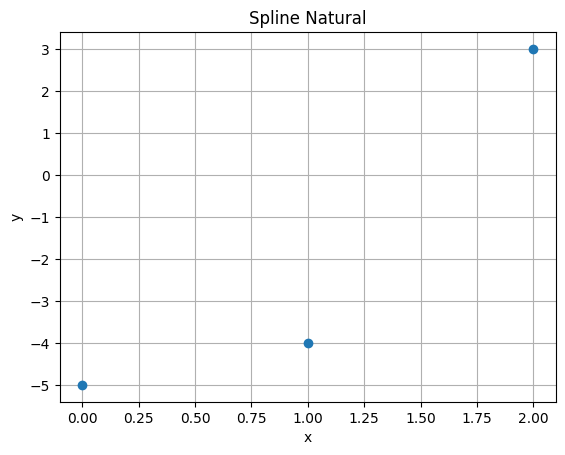

In [16]:
x = [0, 1, 2]
y = [-5, -4, 3]
plt.plot(x, y, 'o')
plt.title('Spline Natural')
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

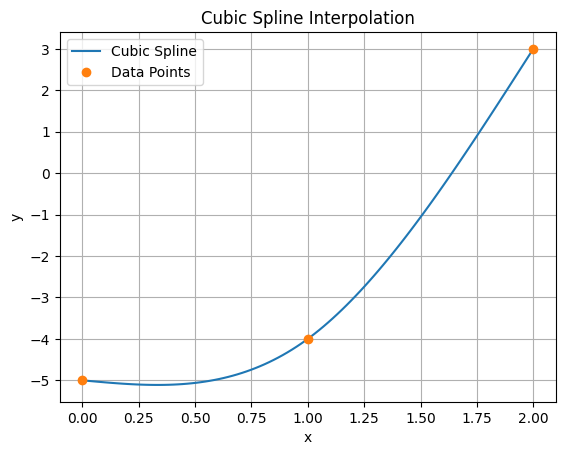

In [17]:
def S_0(x):
    return 1.5*x**3-0.5*x-5
def S_1(x):
    return -1.5*(x-1)**3 +4.5*(x-1)**2 +4*(x-1) -4
x_vals = np.linspace(0, 2, 100)
y_vals = np.piecewise(x_vals, [x_vals < 1, x_vals >= 1], [S_0, S_1])
plt.plot(x_vals, y_vals, label='Cubic Spline')
plt.plot(x, y, 'o', label='Data Points')
plt.title('Cubic Spline Interpolation')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid()
plt.show()

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.interpolate import CubicSpline  # Importar la clase CubicSpline
from IPython.display import HTML

# Datos de entrada
xs_data = [0, 1, 2]
ys_data = [-5, -4, 3]

# Crear las figuras y ejes para la animación 1 (variación de B1)
fig1, ax1 = plt.subplots()
ax1.set_xlim(min(xs_data)-0.5, max(xs_data)+0.5)
ax1.set_ylim(min(ys_data)-5, max(ys_data)+5)
ax1.grid(True)
ax1.plot(xs_data, ys_data, 'ro', label='Datos Fijos')
line1, = ax1.plot([], [], 'b-', lw=2, label='Spline')
title1 = ax1.text(0.5, 1.05, "", transform=ax1.transAxes, ha="center")
ax1.legend()

# Función de actualización para la animación 1 (variación de B1)
def update_b1(b1_val):
    # Crear el spline cúbico con B0=1 y B1 variable
    cs = CubicSpline(xs_data, ys_data, bc_type=((1, b1_val), (1, 0)))  # B1 variable, B0 = 1 (clamped)
    x_p = np.linspace(min(xs_data), max(xs_data), 100)
    y_p = cs(x_p)  # Evaluamos el spline en los puntos x_p
    line1.set_data(x_p, y_p)
    title1.set_text(f"Variando B1 = {b1_val:.2f}")
    return line1, title1

# Frames para la animación 1
frames_b1 = np.linspace(-10, 10, 50)
anim1 = FuncAnimation(fig1, update_b1, frames=frames_b1, interval=100, blit=True)

# Mostrar animación 1 en Jupyter
display(HTML(anim1.to_jshtml()))
plt.close()

# Crear la segunda figura y ejes para la animación 2 (movimiento de un punto)
fig2, ax2 = plt.subplots()
ax2.set_xlim(min(xs_data)-0.5, max(xs_data)+0.5)
ax2.set_ylim(-10, 10)
ax2.grid(True)
line2, = ax2.plot([], [], 'g-', lw=2, label='Spline')
points2, = ax2.plot([], [], 'ro', label='Puntos')
title2 = ax2.text(0.5, 1.05, "", transform=ax2.transAxes, ha="center")
ax2.legend()

# Función de actualización para la animación 2 (movimiento de un punto)
def update_point(y_mid):
    current_ys = [ys_data[0], y_mid, ys_data[2]]
    # Usamos el spline cúbico con los nuevos valores
    cs = CubicSpline(xs_data, current_ys, bc_type=((1, 0), (1, 0)))  # Condiciones de frontera (clamped)
    x_p = np.linspace(min(xs_data), max(xs_data), 100)
    y_p = cs(x_p)  # Evaluamos el spline en los puntos x_p
    line2.set_data(x_p, y_p)
    points2.set_data(xs_data, current_ys)
    title2.set_text(f"Moviendo y1 = {y_mid:.2f}")
    return line2, points2, title2

# y1 varía subiendo y bajando
frames_pt = np.concatenate([np.linspace(-4, 0, 30), np.linspace(0, -8, 30), np.linspace(-8, -4, 30)])
anim2 = FuncAnimation(fig2, update_point, frames=frames_pt, interval=50, blit=True)

# Mostrar animación 2
display(HTML(anim2.to_jshtml()))

# Guardar animaciones si se desea
plt.close()


In [21]:
xs = [0, 1, 2, 3]
ys = [-1, 1, 5, 2]

splines = cubic_spline(xs=xs, ys=ys)
_ = [display(s) for s in splines]
print("______")
_ = [display(s.expand()) for s in splines]

2 5 1.0 -6.0 2.0
1 1 4.0 3.0 -3.0
0 -1 1.0 0.0 1.0


1.0*x**3 + 1.0*x - 1

4.0*x - 3.0*(x - 1)**3 + 3.0*(x - 1)**2 - 3.0

1.0*x + 2.0*(x - 2)**3 - 6.0*(x - 2)**2 + 3.0

______


1.0*x**3 + 1.0*x - 1

-3.0*x**3 + 12.0*x**2 - 11.0*x + 3.0

2.0*x**3 - 18.0*x**2 + 49.0*x - 37.0

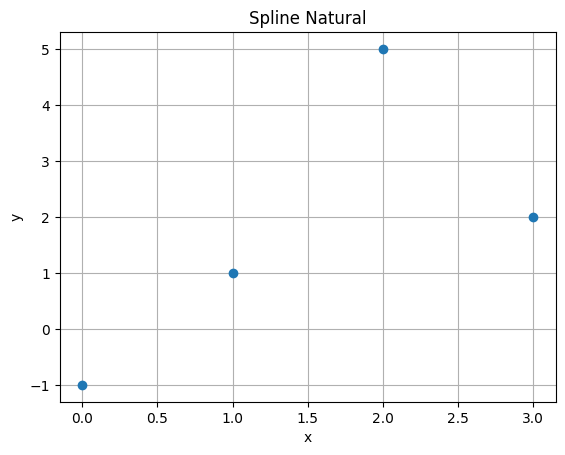

In [22]:
x = [0, 1, 2, 3]
y = [-1, 1, 5, 2]
plt.plot(x, y, 'o')
plt.title('Spline Natural')
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

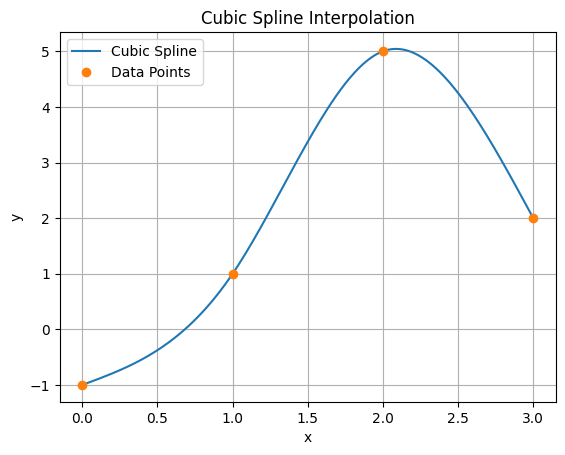

In [23]:
def S_0(x):
    return x**3 +x  -1
def S_1(x):
    return -3*(x-1)**3 +3*(x-1)**2 +4*(x-1) +1
def S_2(x):
    return 2*(x-2)**3 -6*(x-2)**2 +(x-2) +5
x_vals = np.linspace(0, 3, 200)
y_vals = np.piecewise(x_vals, [x_vals < 1, (x_vals >= 1) & (x_vals < 2), x_vals >= 2], [S_0, S_1, S_2])
plt.plot(x_vals, y_vals, label='Cubic Spline')
plt.plot(x, y, 'o', label='Data Points')
plt.title('Cubic Spline Interpolation')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid()
plt.show()
                                            

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.interpolate import CubicSpline  # Importar la clase CubicSpline
from IPython.display import HTML

# Datos del ejercicio
xs_data = [0, 1, 2, 3]
ys_data = [-1, 1, 5, 2]

# Función para generar la curva spline con condiciones de frontera (clamped)
def get_clamped_spline_curve(xs, ys, B0=1, B1=0):
    # Crear el spline cúbico con condiciones de frontera (clamped)
    cs = CubicSpline(xs, ys, bc_type=((1, B0), (1, B1)))  # B0=1, B1 variable
    x_p = np.linspace(min(xs), max(xs), 100)
    y_p = cs(x_p)  # Evaluamos el spline en los puntos x_p
    return x_p, y_p

# =======================================================
# ANIMACIÓN 1: Variando B1 (Pendiente final en x=3)
# =======================================================
fig1, ax1 = plt.subplots()
ax1.set_xlim(min(xs_data)-0.5, max(xs_data)+0.5)
ax1.set_ylim(-5, 10)  # Rango ajustado para visualizar bien las curvas
ax1.grid(True)
ax1.plot(xs_data, ys_data, 'ro', label='Datos Fijos')
line1, = ax1.plot([], [], 'b-', lw=2, label='Spline')
title1 = ax1.text(0.5, 1.05, "", transform=ax1.transAxes, ha="center")
ax1.legend()

# Función de actualización para la animación 1 (variación de B1)
def update_b1(b1_val):
    x_p, y_p = get_clamped_spline_curve(xs_data, ys_data, B0=1, B1=b1_val)
    line1.set_data(x_p, y_p)
    title1.set_text(f"Variando B1 = {b1_val:.2f}")
    return line1, title1

frames_b1 = np.linspace(-10, 10, 50)
anim1 = FuncAnimation(fig1, update_b1, frames=frames_b1, interval=100, blit=True)

display(HTML(anim1.to_jshtml()))
plt.close()

print("\n" + "="*40 + "\n")

# =======================================================
# ANIMACIÓN 2: Moviendo el punto y1
# =======================================================
fig2, ax2 = plt.subplots()
ax2.set_xlim(min(xs_data)-0.5, max(xs_data)+0.5)
ax2.set_ylim(-5, 10)
ax2.grid(True)
line2, = ax2.plot([], [], 'g-', lw=2, label='Spline')
points2, = ax2.plot([], [], 'ro', label='Puntos')
title2 = ax2.text(0.5, 1.05, "", transform=ax2.transAxes, ha="center")
ax2.legend()

# Función de actualización para la animación 2 (movimiento de un punto)
def update_point(y_mid):
    current_ys = [ys_data[0], y_mid, ys_data[2], ys_data[3]]  # Cambiar solo y1
    
    x_p, y_p = get_clamped_spline_curve(xs_data, current_ys, B0=1, B1=0)
    
    line2.set_data(x_p, y_p)
    points2.set_data(xs_data, current_ys)
    title2.set_text(f"Moviendo y1 = {y_mid:.2f}")
    return line2, points2, title2

frames_pt = np.concatenate([np.linspace(1, 6, 30), np.linspace(6, -4, 30), np.linspace(-4, 1, 30)])
anim2 = FuncAnimation(fig2, update_point, frames=frames_pt, interval=50, blit=True)

display(HTML(anim2.to_jshtml()))

plt.close()
